# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and play with it yourself. __DO NOT__ request access to this tutorial.


# Install detectron2

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1 'pycocotools>=2.0.1'
#!pip install torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
#!gcc --version
# opencv is pre-installed on colab

     |████████████████████████████████| 276kB 12.2MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=8dd986d3fda9870c9046b7e3dedcdba24c254b711c21d3e25fffb19a19f91fec
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
1.6.0+cu101 True


In [ ]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 633kB/s 
     |████████████████████████████████| 2.2MB 17.3MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201103-cp36-none-any.whl size=44309 sha256=4781d68da88fb02f0d274b71bcad0d181f6d6fdd1b0c43ba9e903a36ea7f5294
  Stored in directory: /root/.cache/pip/wheels/9e/69/d8/9f4458580817c37c0b844fd4f20379a29c314ef50332d0379e
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
def load_sem_seg(gt_root, image_root, gt_ext="png", image_ext="jpg"):
    """
    Load semantic segmentation datasets. All files under "gt_root" with "gt_ext" extension are
    treated as ground truth annotations and all files under "image_root" with "image_ext" extension
    as input images. Ground truth and input images are matched using file paths relative to
    "gt_root" and "image_root" respectively without taking into account file extensions.
    This works for COCO as well as some other datasets.

    Args:
        gt_root (str): full path to ground truth semantic segmentation files. Semantic segmentation
            annotations are stored as images with integer values in pixels that represent
            corresponding semantic labels.
        image_root (str): the directory where the input images are.
        gt_ext (str): file extension for ground truth annotations.
        image_ext (str): file extension for input images.

    Returns:
        list[dict]:
            a list of dicts in detectron2 standard format without instance-level
            annotation.

    Notes:
        1. This function does not read the image and ground truth files.
           The results do not have the "image" and "sem_seg" fields.
    """

    # We match input images with ground truth based on their relative filepaths (without file
    # extensions) starting from 'image_root' and 'gt_root' respectively.
    def file2id(folder_path, file_path):
        # extract relative path starting from `folder_path`
        image_id = os.path.normpath(os.path.relpath(file_path, start=folder_path))
        # remove file extension
        image_id = os.path.splitext(image_id)[0]
        return image_id

    input_files = sorted(
        (os.path.join(image_root, f) for f in PathManager.ls(image_root) if f.endswith(image_ext)),
        key=lambda file_path: file2id(image_root, file_path),
    )
    gt_files = sorted(
        (os.path.join(gt_root, f) for f in PathManager.ls(gt_root) if f.endswith(gt_ext)),
        key=lambda file_path: file2id(gt_root, file_path),
    )

    assert len(gt_files) > 0, "No annotations found in {}.".format(gt_root)

    # Use the intersection, so that val2017_100 annotations can run smoothly with val2017 images
    if len(input_files) != len(gt_files):
        logger.warn(
            "Directory {} and {} has {} and {} files, respectively.".format(
                image_root, gt_root, len(input_files), len(gt_files)
            )
        )
        input_basenames = [os.path.basename(f)[: -len(image_ext)] for f in input_files]
        gt_basenames = [os.path.basename(f)[: -len(gt_ext)] for f in gt_files]
        intersect = list(set(input_basenames) & set(gt_basenames))
        # sort, otherwise each worker may obtain a list[dict] in different order
        intersect = sorted(intersect)
        logger.warn("Will use their intersection of {} files.".format(len(intersect)))
        input_files = [os.path.join(image_root, f + image_ext) for f in intersect]
        gt_files = [os.path.join(gt_root, f + gt_ext) for f in intersect]

    logger.info(
        "Loaded {} images with semantic segmentation from {}".format(len(input_files), image_root)
    )

    dataset_dicts = []
    for (img_path, gt_path) in zip(input_files, gt_files):
        record = {}
        record["file_name"] = img_path
        record["sem_seg_file_name"] = gt_path
        dataset_dicts.append(record)

    return dataset_dicts


In [ ]:
from fvcore.common.file_io import PathManager
import logging
logger = logging.getLogger(__name__)

#datalabels=load_sem_seg(annotations, images_dir, gt_ext="png", image_ext="png")


##images_dir = "/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2"
#annotations="/content/drive/My Drive/CIS581/FinalProject/Kitti/trainingmask/"

images_dir = "/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/"
annotations="/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/labels/train/"
json_fileloc="/content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json"

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train5", {}, "/content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json",images_dir)



In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "/content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

for d in ["train", "val"]:
    DatasetCatalog.register("balloon" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
    MetadataCatalog.get("balloon" + d).set(thing_classes=["balloon"])
balloon_metadata = MetadataCatalog.get("balloon_train")

[11/03 21:37:51 d2.data.datasets.coco]: Loading /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json takes 1.94 seconds.
WARNING [11/03 21:37:51 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/03 21:37:51 d2.data.datasets.coco]: Loaded 999 images in COCO format from /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json
filename= /content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/0ee642f9-22c03b1a.jpg


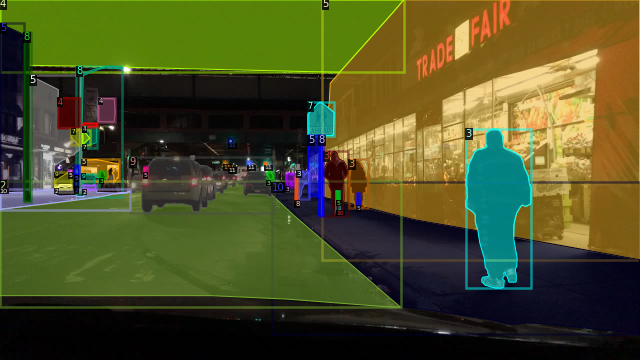

filename= /content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/0abeea78-647aef5c.jpg


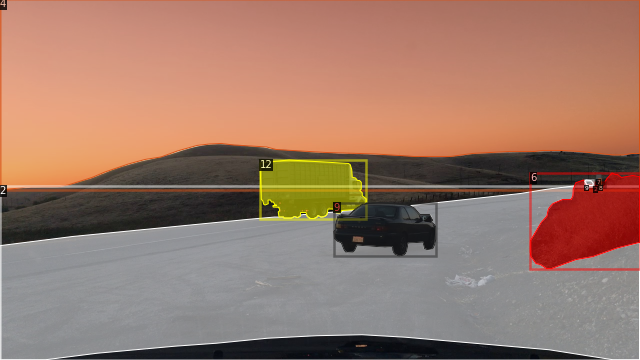

filename= /content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/03c98179-6c07ce8c.jpg


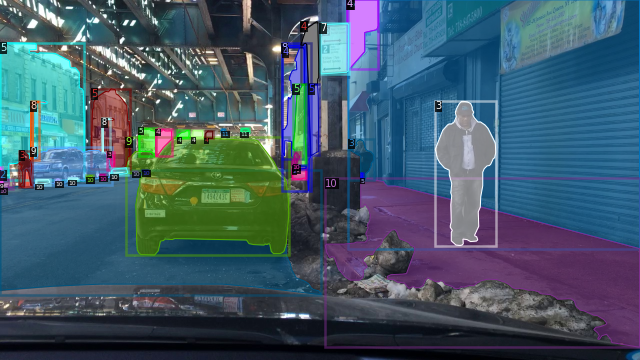

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train5")
dataset_dicts = DatasetCatalog.get("my_dataset_train5")
import random
from detectron2.utils.visualizer import Visualizer
for d in random.sample(dataset_dicts, 3):
    print("filename=",d["file_name"])
    img = cv2.imread(d["file_name"])

    #print("filename=","/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/5421185a-fbbb8f7f.jpg")
    #img = cv2.imread("/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/5421185a-fbbb8f7f.jpg")
    visualizer = Visualizer(img[:, :, ::-1], scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    #cv2_imshow(img)

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train5",)
cfg.DATASETS.TEST = ()#"my_dataset_val3",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")#"COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")   #"COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001  #0.00025  # pick a good LR

cfg.SOLVER.WARMUP_ITERS=1000
cfg.SOLVER.MAX_ITER = 3000   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset

#cfg.SOLVER.STEPS=(10,15)
#cfg.SOLVER.GAMMA=0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64 #128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 14  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)

#cfg.TEST.EVAL_PERIOD=500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/03 21:43:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (15, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (15,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (56, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (56,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (14, 256, 1, 

[11/03 21:43:11 d2.engine.train_loop]: Starting training from iteration 0
[11/03 21:43:34 d2.utils.events]:  eta: 0:56:28  iter: 19  total_loss: 6.609  loss_cls: 2.744  loss_box_reg: 0.581  loss_mask: 0.690  loss_rpn_cls: 1.663  loss_rpn_loc: 0.876  time: 1.1399  data_time: 0.0456  lr: 0.000020  max_mem: 4984M
[11/03 21:43:58 d2.utils.events]:  eta: 0:57:56  iter: 39  total_loss: 5.660  loss_cls: 2.414  loss_box_reg: 0.610  loss_mask: 0.686  loss_rpn_cls: 1.096  loss_rpn_loc: 0.806  time: 1.1657  data_time: 0.0141  lr: 0.000040  max_mem: 4984M
[11/03 21:44:21 d2.utils.events]:  eta: 0:57:01  iter: 59  total_loss: 4.442  loss_cls: 1.741  loss_box_reg: 0.580  loss_mask: 0.679  loss_rpn_cls: 0.477  loss_rpn_loc: 0.898  time: 1.1548  data_time: 0.0140  lr: 0.000060  max_mem: 4984M
[11/03 21:44:43 d2.utils.events]:  eta: 0:56:12  iter: 79  total_loss: 3.501  loss_cls: 1.158  loss_box_reg: 0.510  loss_mask: 0.675  loss_rpn_cls: 0.312  loss_rpn_loc: 0.820  time: 1.1502  data_time: 0.0138  lr:

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

WARNING [11/03 22:40:46 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/03 22:40:46 d2.data.datasets.coco]: Loaded 999 images in COCO format from /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json


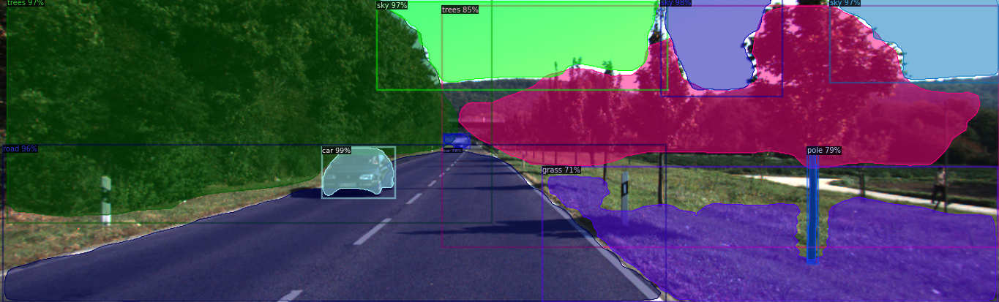

In [ ]:
from detectron2.utils.visualizer import ColorMode


#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_val3")
#dataset_dicts = DatasetCatalog.get("my_dataset_train3")
#dataset_dicts = get_balloon_dicts("my_dataset_val3")

#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train3")
dataset_dicts = DatasetCatalog.get("my_dataset_train5")

#for d in random.sample(dataset_dicts, 3):    
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2/000183_10.png")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

WARNING [11/03 22:41:03 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/03 22:41:03 d2.data.datasets.coco]: Loaded 999 images in COCO format from /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json


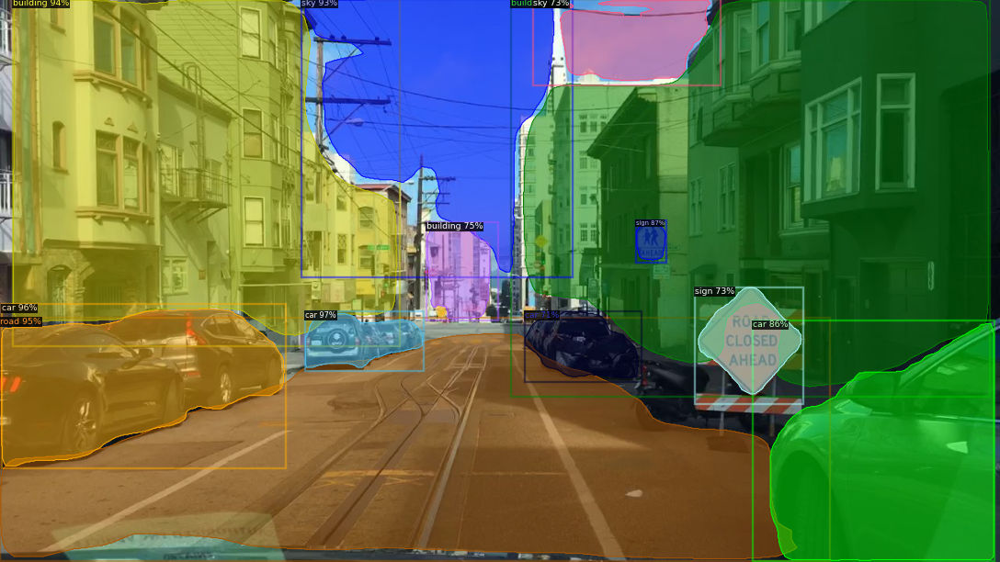

In [ ]:
from detectron2.utils.visualizer import ColorMode


#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_val3")
#dataset_dicts = DatasetCatalog.get("my_dataset_train3")
#dataset_dicts = get_balloon_dicts("my_dataset_val3")

#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train3")
dataset_dicts = DatasetCatalog.get("my_dataset_train5")

#for d in random.sample(dataset_dicts, 3):    
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/f482559d-d3d798d3.jpg")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=.85)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

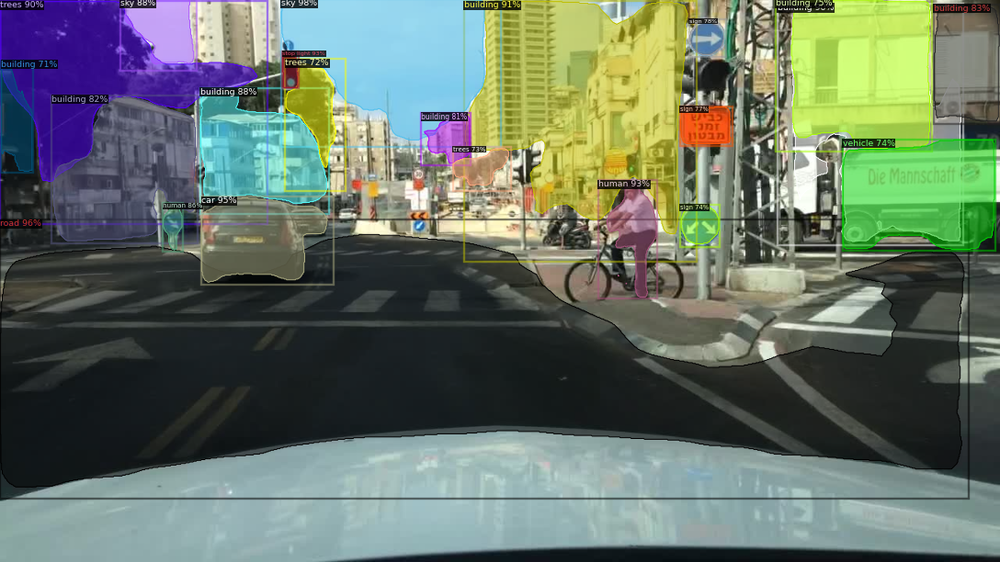

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/f00e798d-847367b0.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

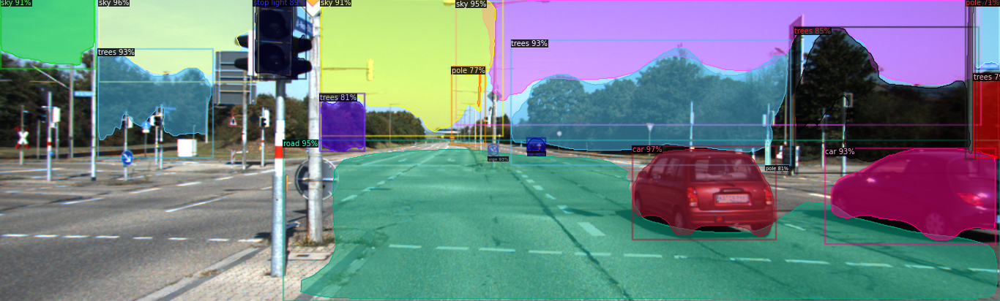

In [ ]:
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2/000047_10.png")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

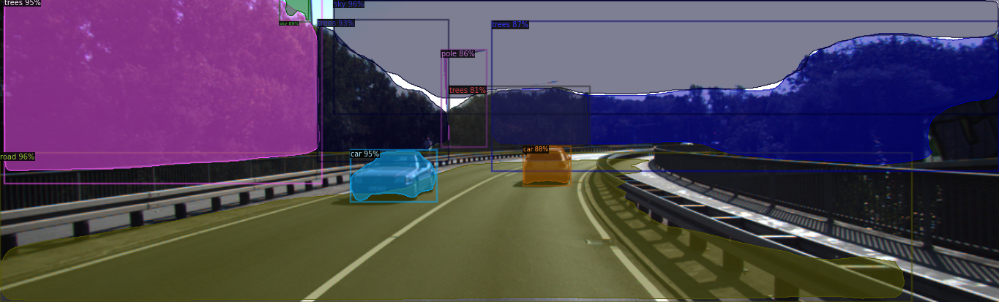

In [ ]:
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2/000176_10.png")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

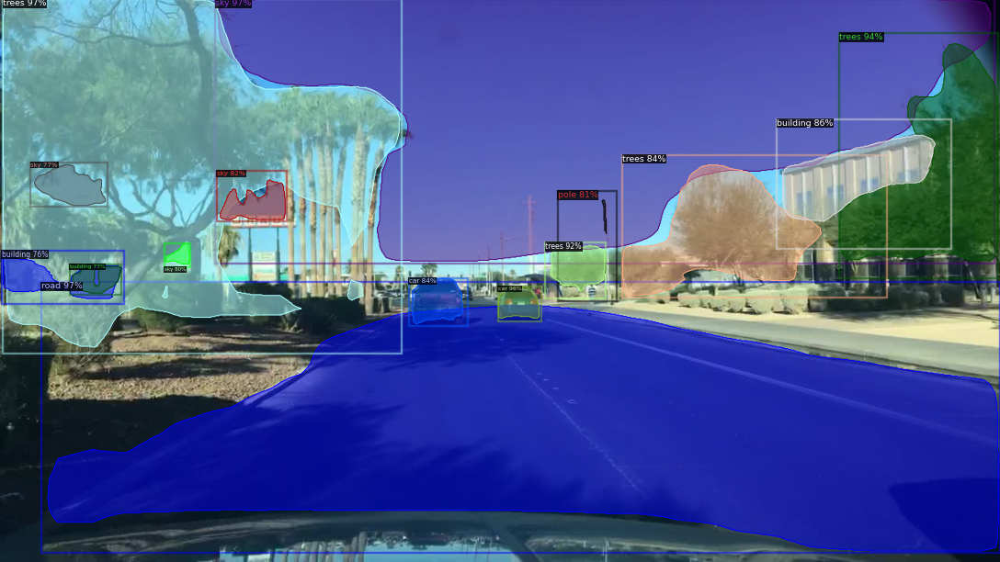

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/ccd0ec33-2be0fb05.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

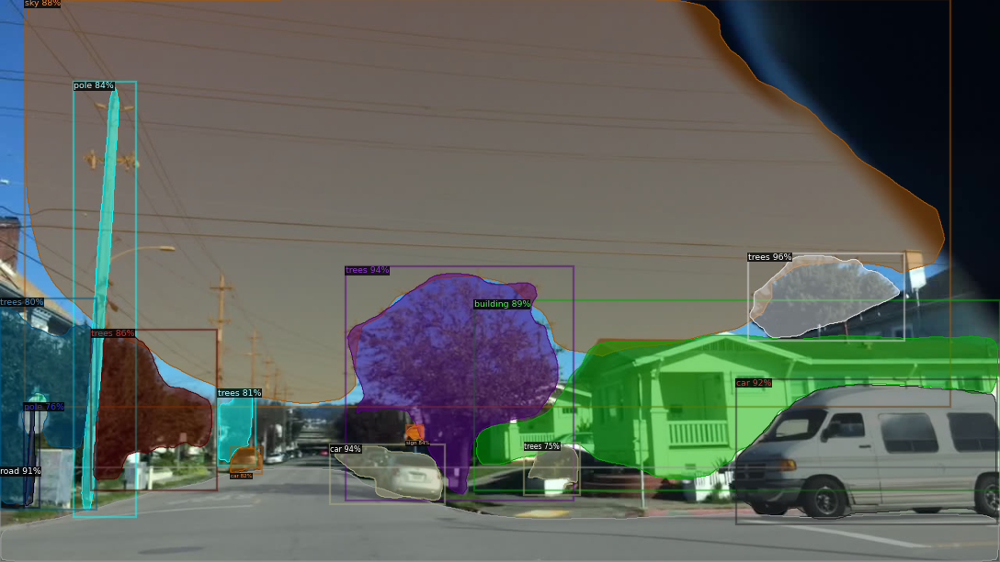

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/cdb992be-f0f1613c.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

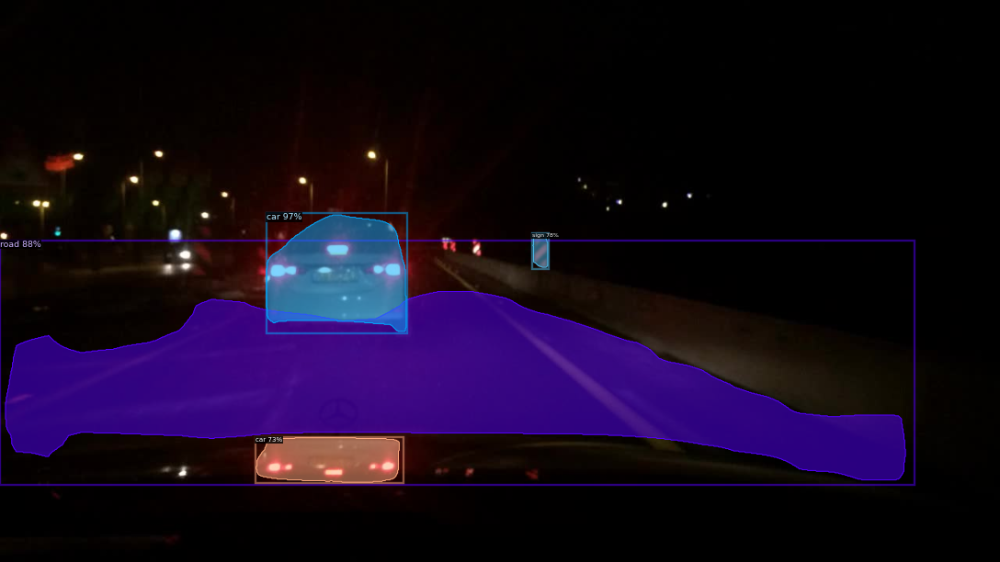

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/ce6aa1eb-90709a5b.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

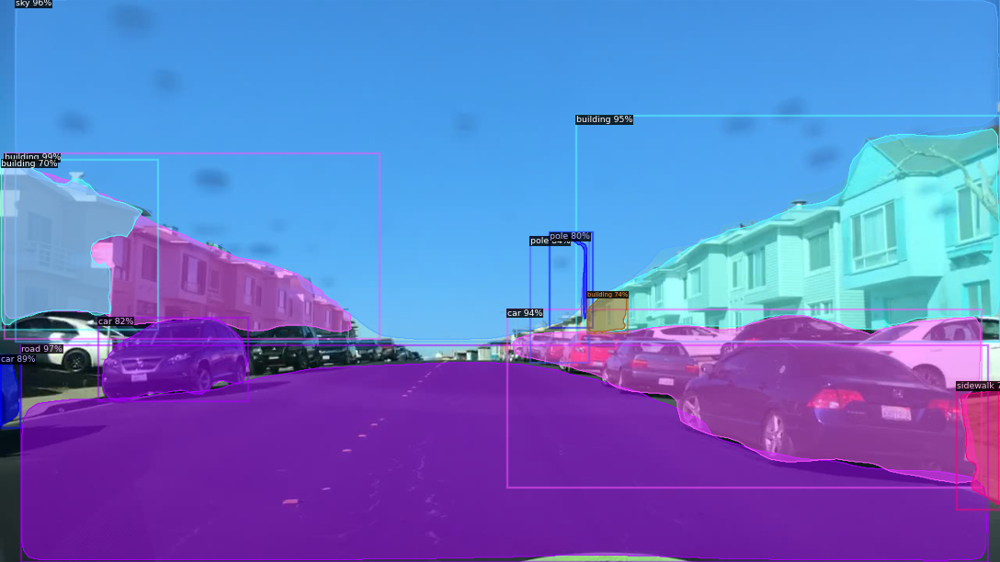

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/cf19b33b-85ffec6d.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

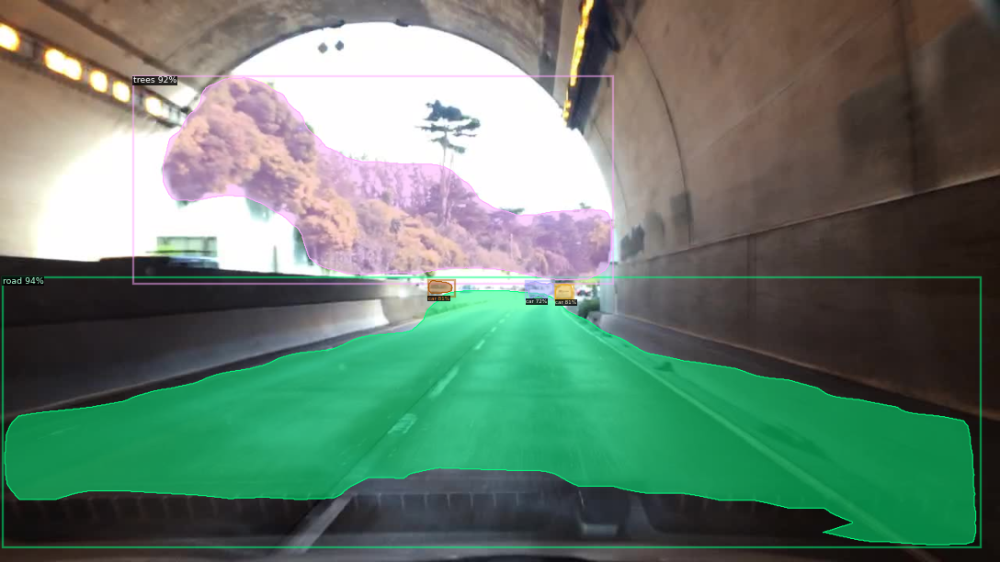

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/d6fd12ed-d08267fa.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

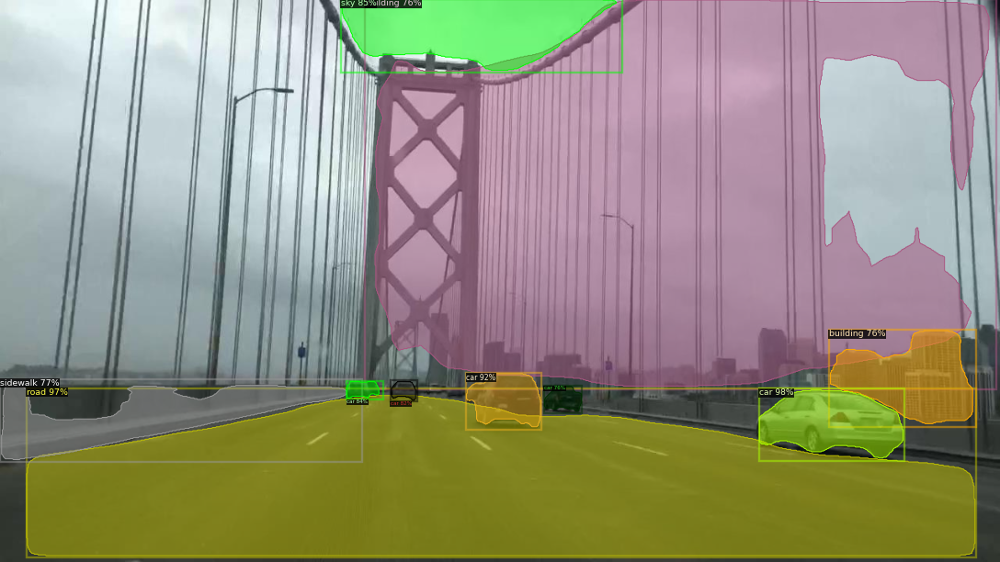

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/d07b3e01-1ff03d3b.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

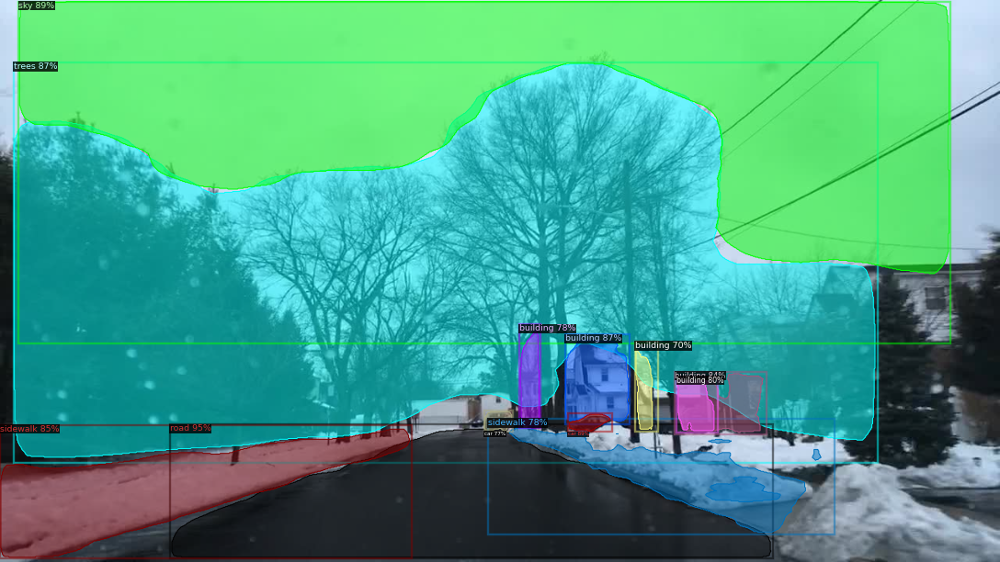

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/d7402ea7-cc563c45.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

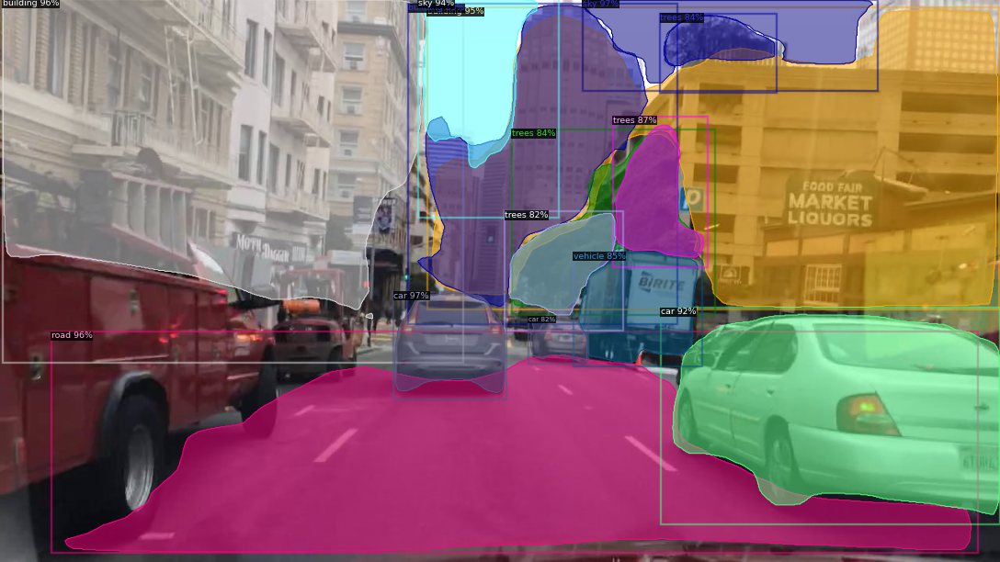

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/bdfcba58-078407cd.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])